# FCOS Model Inference using PyTorch

FCOS model is available in [torchvision](https://pytorch.org/vision/main/models/fcos.html). Let us use the pre-trained model for image and video inference. 


In [ ]:
# !pip install -r requirements.txt

In [4]:
import torch
import numpy as np
import cv2
import torchvision
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
from torch.utils.data import Dataset, DataLoader
import glob
import os
import json
import time
import csv
import sklearn.metrics as metrics

## Utils

Let us write different utils function that is needed for inference and visualization. 

Create a directory to save inference results.


In [2]:
# Create result directory.
result_dir = 'results'
os.makedirs(result_dir, exist_ok=True)
# Create checkpoint directory.
checkpoint_dir = 'checkpoints'
os.makedirs(checkpoint_dir, exist_ok=True)

Let's use GPU (Cuda) if available.

In [3]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Using {}.'.format(device))

Using cuda.


The pre-trained model is trained on the COCO dataset. The model predicts the class index. To map it to the class name, let us define the COCO class name list. 

In [4]:
IBEM_CLASSES = [
    '__background__', 'isolated', 'embedded', 'embedded_split'
]

In [ ]:
# COCO_CLASSES = [
#     '__background__', 'person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus',
#     'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'N/A', 'stop sign',
#     'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow',
#     'elephant', 'bear', 'zebra', 'giraffe', 'N/A', 'backpack', 'umbrella', 'N/A', 'N/A',
#     'handbag', 'tie', 'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball',
#     'kite', 'baseball bat', 'baseball glove', 'skateboard', 'surfboard', 'tennis racket',
#     'bottle', 'N/A', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl',
#     'banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza',
#     'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed', 'N/A', 'dining table',
#     'N/A', 'N/A', 'toilet', 'N/A', 'tv', 'laptop', 'mouse', 'remote', 'keyboard', 'cell phone',
#     'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'N/A', 'book',
#     'clock', 'vase', 'scissors', 'teddy bear', 'hair drier', 'toothbrush'
# ]

After model inference, we need to plot the predicted bounding box. It is better to use different colors for different classes. So let us generate it. 


In [5]:
# Create different colors for each class.
np.random.seed(42)
COLORS = np.random.uniform(0, 255, size=(len(IBEM_CLASSES), 3))

Here is a function that downloads FCOS (fcos_resnet50_fpn) model weight using torchvision, loads it, and returns it in eval mood.

In [6]:
# Function to load the model.
# num_classes = len(IBEM_CLASSES)
def get_model(device, num_classes=4, disp_prog=False):    
    model = torchvision.models.detection.fcos_resnet50_fpn(weights=None, progress=disp_prog, num_classes=num_classes, weights_backbone=None).to(device)
    return model

def set_eval_model(model, device):
    # Load the model onto the computation device.
    model = model.eval().to(device)
    return model

def set_train_model(model, device):
    # Load the model onto the computation device.
    model = model.train().to(device)
    return model

## Saving and Loading Checkpoints

In [11]:
def save_prog(epoch, train_loss, val_acc, val_f1, model, optim, path):
    torch.save({
            'epoch': epoch,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optim.state_dict(),
            'train_loss': train_loss,
            'val_acc': val_acc,
            'val_f1': val_f1
            }, path)

def load_prog(path, model, optim):
    checkpoint = torch.load(path)
    model.load_state_dict(checkpoint['model_state_dict'])
    optim.load_state_dict(checkpoint['optimizer_state_dict'])
    epoch = checkpoint['epoch']
    start_epoch = int(epoch) + 1
    train_loss = checkpoint['train_loss']
    val_acc = checkpoint['val_acc']
    val_f1 = checkpoint['val_f1']
    return model, optim, start_epoch, train_loss, val_acc, val_f1

Before inference, the input images need to have some standard transform. Here, it is the most basic you can imagine. You only have to transform to tensor. 


In [12]:
# Define the torchvision image transforms.
transform = transforms.Compose([
    transforms.ToTensor()
])

Here is a function to visualize four images in a 2 x 2 grid. 

In [13]:
# Plot and visualize images in a 2x2 grid.
def visualize(result_dir):
    """
    Function accepts a list of images and plots
    them in a 2x2 grid.
    """
    plt.figure(figsize=(20, 18))
    image_names = glob.glob(os.path.join(result_dir, '*.jpg'))
    for i, image_name in enumerate(image_names):
        image = plt.imread(image_name)
        plt.subplot(2, 2, i+1)
        plt.imshow(image)
        plt.axis('off')
    plt.tight_layout()
    plt.show()

In [14]:
# Plot result losses/scores per epoch
def plot_results(results, label, data_type, title):
    plt.plot(results, label=label)
    plt.title(title)
    plt.xlabel("Epochs")
    plt.ylabel(data_type)
    plt.legend()
    plt.show()

## Prediction Function

Let us write a function for inference. It takes images, the model, which device to use (GPU or CPU), and the bounding box threshold. And it returns bounding boxes co-ordinates, class names, and the class index. 

In [15]:
@torch.no_grad()
def predict(images, model, detection_threshold):
    """
    Predict the output of images after forward pass through
    the model and return the bounding boxes, class names, and 
    class labels. 
    """
    # b_s_time = time.time()

    outputs = None
    pred_labels = []
    pred_classes = []
    pred_boxes = []

    # Get the predictions on the image.
    with torch.no_grad():
        outputs = model(images) 

    for j in range(len(outputs)):
        # Get score for all the predicted objects.
        scores = outputs[j]['scores'].detach().cpu().numpy()
        bboxes = outputs[j]['boxes'].detach().cpu().numpy()
        pred_boxes.append(bboxes[scores >= detection_threshold].astype(np.int32))
        labels = outputs[j]['labels'][scores >= detection_threshold].detach().cpu().numpy()
        pred_labels.append(labels)
        pred_classes.append([IBEM_CLASSES[i] for i in labels])

    # p_fps = batch_size/(time.time() - b_s_time)
    # print("Test batch", p_fps)
    print('prediction', pred_boxes, pred_classes, labels)

    return pred_boxes, pred_classes, labels

## Annotation Functions

Here is a function that takes bounding boxes, their class name, class index, and the inferred image and returns annotated image. 


In [16]:
def draw_boxes(boxes, classes, labels, image):
    """
    Draws the bounding box around a detected object.
    """
    lw = max(round(sum(image.shape) / 2 * 0.003), 2) # Line width.
    tf = max(lw - 1, 1) # Font thickness.
    
    for i, box in enumerate(boxes):
        p1, p2 = (int(box[0]), int(box[1])), (int(box[2]), int(box[3]))
        color = COLORS[labels[i]]
        class_name = classes[i]
        cv2.rectangle(
            image,
            p1,
            p2,
            color[::-1],
            thickness=lw,
            lineType=cv2.LINE_AA
        )
        # For filled rectangle.
        w, h = cv2.getTextSize(
            class_name, 
            0, 
            fontScale=lw / 3, 
            thickness=tf
        )[0]  # Text width, height
        
        outside = p1[1] - h >= 3
        p2 = p1[0] + w, p1[1] - h - 3 if outside else p1[1] + h + 3
        
        cv2.rectangle(
            image, 
            p1, 
            p2, 
            color=color[::-1], 
            thickness=-1, 
            lineType=cv2.LINE_AA
        )  
        cv2.putText(
            image, 
            class_name, 
            (p1[0], p1[1] - 5 if outside else p1[1] + h + 2),
            cv2.FONT_HERSHEY_SIMPLEX, 
            fontScale=lw / 3.8, 
            color=(255, 255, 255), 
            thickness=tf, 
            lineType=cv2.LINE_AA
        )
    return image

## Setup Model

In [17]:
# Ex: IBEM/partitions/Tr00.lst
def convert_list(path):
    file = open(path, 'r')
    data = file.read()
    img_names = data.split('\n')
    file.close()
    return img_names

def convert_json_to_dict(path):
    file = open(path, 'r')
    data = json.load(file)
    file.close()
    return data

In [4]:
# lst_list = convert_list('IBEM/partitions/Tr00.lst')
# print(lst_list[0])
# json_list = convert_json_to_dict('IBEM/IBEM.json')
# print(json_list[lst_list[0]])

0001015_page001
{'isolated': {'0': {'x_min': 22.18, 'y_min': 82.37, 'x_max': 47.47, 'y_max': 86.23, 'split': 'single', 'latex': '\\begin {equation}\\label {GFIeq} \\int _{{\\rm fields}/{\\rm symmetries}} \\Dpath \\phi \\, \\exp \\left ( i S[\\phi ] \\right ) \\end {equation}', 'latex_norm': '\\begin{equation*} \\int _ { f i e l d s \\slash s y m m e t r i e s } D \\phi \\, \\operatorname { e x p } ( i S [ \\phi ] ) \\end{equation*}', 'latex_expand': '\\begin{equation*} \\int _ { \\mathrm { f i e l d s } \\slash \\mathrm { s y m m e t r i e s } } \\mitD \\mitphi \\, \\operatorname { e x p } \\left( \\miti \\mitS [ \\mitphi ] \\right) \\end{equation*}'}}, 'preamble': '\\documentclass[a4paper,fleqn,12pt]{article}\n\\usepackage{amsfonts,amssymb}\n%%%%%%%%%%%%%%%%%%\n\\newcommand{\\End}{\\nonumber\\\\}\n\\newcommand{\\Bbc}[1]{{\\bf #1}}\n\\newcommand{\\Real}{{\\Bbc{R}}}\n\\newcommand{\\Dpath}{{\\cal{D}}}\n\\newcommand{\\half}{\\frac12}\n\\newcommand{\\Intot}{\\int_{0}^{t}}\n\\newcommand{\\O

In [18]:
class IBEMDataset(Dataset):
    """IBEM dataset."""

    def __init__(self, lst_file, json_file, img_dir, device):
        """
        Arguments:
            lst_file (string): Path to lst_file with images to reference for set.
            json_file (string): Path to the json file with labels and bounding boxes.
            root_dir (string): Directory with all the images.
        """
        self.lst_file = convert_list(lst_file)
        self.lst_file.pop()
        self.json_file = convert_json_to_dict(json_file)
        self.img_dir = img_dir
        self.device = device
    def __len__(self):
        return len(self.lst_file)

    def __getitem__(self, idx):
        if torch.is_tensor(idx):
            idx = idx.tolist()
        
        img_name = self.lst_file[idx]
        rem_index = img_name.index('e') + 1
        t_img_name = img_name[:rem_index] + img_name[rem_index+1:]
        img_path = self.img_dir + t_img_name + '.jpg'

        img = cv2.imread(img_path)
        image = transform(img).to(self.device)

        c_dict = self.json_file[img_name]

        b_box_list = []
        label_list = []

        if 'isolated' in c_dict.keys():
            i_dict = c_dict['isolated']
            for i in range(len(i_dict.keys())):
                b_box_list.append([i_dict[str(i)]['x_min'], i_dict[str(i)]['y_min'], i_dict[str(i)]['x_max'], i_dict[str(i)]['y_max']])
                label_list.append(1) # isolated
        if 'embedded' in c_dict.keys():
            e_dict = c_dict['embedded']
            for i in range(len(e_dict.keys())):
                b_box_list.append([e_dict[str(i)]['x_min'], e_dict[str(i)]['y_min'], e_dict[str(i)]['x_max'], e_dict[str(i)]['y_max']])
                if e_dict[str(i)]['split'] == 'single':
                    label_list.append(2) # embedded
                else:
                    label_list.append(3) # embedded_split

        label_dict = {'boxes': torch.FloatTensor(b_box_list).to(self.device), 'labels': torch.tensor(label_list, dtype=torch.int64).to(self.device)}
        return [image, label_dict]

In [19]:
def train_collate(batch):
    img_list = []
    anno_list = []
    for tuple in batch:
        img_list.append(tuple[0])
        anno_list.append(tuple[1])
    return img_list, anno_list

In [20]:
BATCH_SIZE=5
j_file = 'IBEM/IBEM.json'
i_dir = 'IBEM/pages/'

train_dataset = IBEMDataset(lst_file='IBEM/partitions/a_cp/Tr00_cp.lst', json_file=j_file, img_dir=i_dir, device=device)
test_dataset = IBEMDataset(lst_file='IBEM/partitions/a_cp/Ts00_cp.lst', json_file=j_file, img_dir=i_dir, device=device)
val_dataset = IBEMDataset(lst_file='IBEM/partitions/a_cp/Va00_cp.lst', json_file=j_file, img_dir=i_dir, device=device)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, collate_fn=train_collate)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=True, collate_fn=train_collate)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, collate_fn=train_collate)

model = get_model(device, num_classes=len(IBEM_CLASSES), disp_prog=False)
optim=torch.optim.Adam(model.parameters(), lr=1e-4)

start_epoch = 0
EPOCHS = 20 #100000
checkpoint_path = None

checkpoint_path_out = checkpoint_dir + '/checkpoint_pth'

train_loss = []
val_acc = []
val_f1 = []

if checkpoint_path is not None:
    model, optim, start_epoch, train_loss, val_acc, val_f1 = load_prog(checkpoint_path, model, optim)

## Training on Images

Let us write some code for training.

During training, the model expects both the input tensors and targets (list of dictionary), containing:

- boxes (``FloatTensor[N, 4]``): the ground-truth boxes in ``[x1, y1, x2, y2]`` format, with
          ``0 <= x1 < x2 <= W`` and ``0 <= y1 < y2 <= H``

- labels (``Int64Tensor[N]``): the class label for each ground-truth box

The model returns a ``Dict[Tensor]`` during training, containing the classification and regression losses.


In [46]:
# TEST

# for i, sample in enumerate(train_dataset):
#     print(i, train_dataset[i][0].size(), train_dataset[i][1]['boxes'].size(), train_dataset[i][1]['labels'].size())

# for i, batch in enumerate(train_loader):
#     img_list, batch_list = batch
#     print(i, img_list, batch_list)

0 [tensor([[[255, 255, 255,  ..., 255, 255, 255],
         [255, 255, 255,  ..., 255, 255, 255],
         [255, 255, 255,  ..., 255, 255, 255],
         ...,
         [255, 255, 255,  ..., 255, 255, 255],
         [255, 255, 255,  ..., 255, 255, 255],
         [255, 255, 255,  ..., 255, 255, 255]]], dtype=torch.uint8), tensor([[[255, 255, 255,  ..., 255, 255, 255],
         [255, 255, 255,  ..., 255, 255, 255],
         [255, 255, 255,  ..., 255, 255, 255],
         ...,
         [255, 255, 255,  ..., 255, 255, 255],
         [255, 255, 255,  ..., 255, 255, 255],
         [255, 255, 255,  ..., 255, 255, 255]]], dtype=torch.uint8), tensor([[[255, 255, 255,  ..., 255, 255, 255],
         [255, 255, 255,  ..., 255, 255, 255],
         [255, 255, 255,  ..., 255, 255, 255],
         ...,
         [255, 255, 255,  ..., 255, 255, 255],
         [255, 255, 255,  ..., 255, 255, 255],
         [255, 255, 255,  ..., 255, 255, 255]]], dtype=torch.uint8), tensor([[[255, 255, 255,  ..., 255, 255, 25

In [21]:
path = 'IBEM/partitions/a_c/Va01_c.lst'
path_mod = 'IBEM/partitions/Va01_cp.lst'

def check_list(path, path_mod):
    lst = convert_list(path)
    print(lst)
    dict_j = convert_json_to_dict(j_file)
    with open(path_mod, 'w+') as f:
        for item in lst:
            if item in dict_j.keys():
                f.write('%s\n' %item)
    print("File written successfully")
    f.close()

def check_page(path, path_mod, img_dir):
    lst = convert_list(path)
    lst.pop()
    print(lst[-1])
    with open(path_mod, 'w+') as f:
        for item in lst:
            rem_index = item.index('e') + 1
            t_img_name = item[:rem_index] + item[rem_index+1:]
            img_path = img_dir + t_img_name + '.jpg'

            # image = torchvision.io.read_image(img_path)
            if os.path.exists(img_path):
                f.write('%s\n' %item)
    print("File written successfully")
    f.close()

# check_list(path, path_mod)
# check_page(path, path_mod, img_dir=i_dir)

In [22]:
def train(loader, model, optim, device):
    loss_val = 0.0
    # timer = time.time()
    model = set_train_model(model, device)
    # print('Set Train Mode:',time.time() - timer)
    for i, batch in enumerate(loader):
        # b_s_time = time.time()
        img_list, target_list = batch

        # Training Steps
        # Clear the gradients
        optim.zero_grad()
        # Forward Pass
        # timer = time.time()
        loss_dict = model(img_list, target_list)
        # print(i,'Forward Pass:',time.time() - timer)
        # timer = time.time()
        # print(loss_dict)
        loss_cls = loss_dict['classification']
        loss_box = loss_dict['bbox_regression']
        loss_center = loss_dict['bbox_ctrness']
        loss_val = loss_cls.item() + loss_box.item() + loss_center.item()
        # print(loss_val)
        # Find the Loss
        loss = loss_cls + loss_box + loss_center
        # Calculate gradients
        loss.backward()
        # print(i,'Calc Loss:',time.time() - timer)
        # timer = time.time()
        torch.nn.utils.clip_grad_norm_(model.parameters(), 10)
        # Update Weights
        optim.step()
        # print(i,'Optimize:',time.time() - timer)
        # t_fps = BATCH_SIZE/(time.time() - b_s_time)
        # print("Training batch", i, t_fps)
        # del img_list
        # del target_list
    return loss_val

In [ ]:
def compute_iou(groundtruth_box, detection_box):
    g_ymin, g_xmin, g_ymax, g_xmax = tuple(groundtruth_box.tolist())
    d_ymin, d_xmin, d_ymax, d_xmax = tuple(detection_box.tolist())
    
    xa = max(g_xmin, d_xmin)
    ya = max(g_ymin, d_ymin)
    xb = min(g_xmax, d_xmax)
    yb = min(g_ymax, d_ymax)

    intersection = max(0, xb - xa + 1) * max(0, yb - ya + 1)

    boxAArea = (g_xmax - g_xmin + 1) * (g_ymax - g_ymin + 1)
    boxBArea = (d_xmax - d_xmin + 1) * (d_ymax - d_ymin + 1)

    return intersection / float(boxAArea + boxBArea - intersection)

In [ ]:
def calc_confusion_matrix(y_true, y_pred, target_boxes, pred_boxes):
#      # Confusion matrix
#     r = np.flip(metrics.confusion_matrix(y_true, y_pred))

#     precision = metrics.precision_score(y_true=y_true, y_pred=y_pred)
     confusion_matrix = np.zeros(shape=(len(IBEM_CLASSES) + 1, len(IBEM_CLASSES) + 1))

     matches = []
     for i in range(len(target_boxes)):
          for j in range(len(pred_boxes)):
               iou = compute_iou(target_boxes[i], pred_boxes[j])
               
               if iou > 0.5:
                    matches.append([i, j, iou])
     match = np.array(match)
     if matches.shape[0] > 0:
          # Sort list of matches by descending IOU so we can remove duplicate detections
          # while keeping the highest IOU entry.
          matches = matches[matches[:, 2].argsort()[::-1][:len(matches)]]
          
          # Remove duplicate detections from the list.
          matches = matches[np.unique(matches[:,1], return_index=True)[1]]
          
          # Sort the list again by descending IOU. Removing duplicates doesn't preserve
          # our previous sort.
          matches = matches[matches[:, 2].argsort()[::-1][:len(matches)]]
          
          # Remove duplicate ground truths from the list.
          matches = matches[np.unique(matches[:,0], return_index=True)[1]]
          
     for i in range(len(target_boxes)):
          if matches.shape[0] > 0 and matches[matches[:,0] == i].shape[0] == 1:
               confusion_matrix[y_true[i] - 1][y_pred[int(matches[matches[:,0] == i, 1][0])] - 1] += 1 
          else:
               confusion_matrix[y_true[i] - 1][confusion_matrix.shape[1] - 1] += 1
          
     for i in range(len(target_boxes)):
          if matches.shape[0] > 0 and matches[matches[:,1] == i].shape[0] == 0:
               confusion_matrix[confusion_matrix.shape[0] - 1][y_pred[i] - 1] += 1
     return confusion_matrix

In [ ]:
def calc_metrics(conf_matrix):
    recall = np.diag(conf_matrix) / np.sum(conf_matrix, axis = 1)
    precision = np.diag(conf_matrix) / np.sum(conf_matrix, axis = 0)
    f1 = 2 * ((precision * recall)/ (precision + recall))

In [23]:
@torch.no_grad()
def valid(loader, model, device):
    torch.cuda.empty_cache()
    # timer = time.time()
    model = set_eval_model(model, device)
    # print('Set Eval Mode:',time.time() - timer)
    accuracy = 0.0
    f1 = 0.0
    count = 0
    for i, batch in enumerate(loader):
        # timer = time.time()
        img_list, target_list = batch

        boxes, classes, labels = predict(img_list, model, 0.5)

        # conf_matrix = calc_confusion_matrix(target_list['labels'], labels, target_list['boxes'], boxes)
        
        # recall, precision, f1 = calc_metrics(conf_matrix)
        class_index = [i for i in range(len(IBEM_CLASSES))]

        accuracy += metrics.accuracy_score(target_list['labels'], labels, labels=class_index, average='weighted')

        # recall = metrics.recall_score(target_list['labels'], labels, labels=class_index, average='weighted')

        # precision = metrics.precision_score(target_list['labels'], labels, labels=class_index, average='weighted')

        f1 += metrics.f1_score(target_list['labels'], labels, labels=class_index, average='weighted')

        # Forward Pass
        # det_list = model(img_list)


        # print(i,'Forward Pass:',time.time() - timer)
        # timer = time.time()
        
        # for j in range(len(det_list)):
        #     scores = det_list[j]['scores']
        #     for score in scores:
        #         sum_score += score
        #         count += 1
        # print(i,'Score Calc:',time.time() - timer)
        # del img_list
        # del target_list
    return accuracy / count, f1 / count
#sum_score.item() / count

In [24]:
train_len = len(train_dataset)
val_len = len(val_dataset)

train_t = 0.0
val_t = 0.0

start_t = time.time()

RUN = '_test'

for epoch in range(start_epoch, start_epoch + EPOCHS):
    print("EPOCH", epoch)
    t_start_time = time.time()
    train_loss.append(train(train_loader, model, optim, device))
    train_t += time.time() - t_start_time
    v_start_time = time.time()
    acc, f1 = valid(val_loader, model, device)
    val_acc.append(acc)
    val_f1.append(f1)
    val_t += time.time() - v_start_time
    if epoch % 5 == 0:
        c_path = checkpoint_path_out + str(epoch) + RUN + '.pth'
        save_prog(epoch, train_loss, val_acc, val_f1, model, optim, c_path)

c_path = checkpoint_path_out + str(start_epoch + EPOCHS - 1) + RUN + '.pth'
save_prog(str(start_epoch + EPOCHS - 1), train_loss, val_acc, val_f1, model, optim, c_path)

total_t = time.time() - start_t
train_fps = (train_len * (EPOCHS - start_epoch)) / train_t
val_fps = (val_len * (EPOCHS - start_epoch)) / val_t

print("Total train loop time:", total_t)
print("Training FPS:", train_fps)
print("Validation FPS:", val_fps)

with open('timelog.txt', 'w') as f:
    f.write("Total train loop time: ")
    f.write(str(total_t))
    f.write("\n")
    f.write("Training FPS: ")
    f.write(str(train_fps))
    f.write("\n")
    f.write("Validation FPS: ")
    f.write(str(val_fps))
    f.write("\n")

EPOCH 0


In [ ]:
plot_results(train_loss, 'Train', 'loss', 'Training Loss per Epoch')
plot_results(val_score, 'Validation', 'score', 'Validation Score per Epoch')

In [60]:
print(len(train_dataset))
print(len(test_dataset))
print(len(val_dataset))

3665
665
515


## Stats

Training
- FPS: 1.35 fps
- Dataset size: 3665
- 3665 frames / 1.35 fps = 2,714.8 seconds for the training step every epoch
- Takes 45.25 min to do training step per epoch

Validation
- Dataset size: 515

Testing
- FPS:  1.05 fps
- Dataset size: 665
- 665 frames / 1.05 fps = 633.3 seconds for the training step every epoch
- Takes 10.56 min to do training step per epoch

**1 Epoch**

Total train loop time: 6873.818801164627

Training FPS: 0.5379655466543466

Validation FPS: 8.651822409978429

## Inference on Images

Now, we have the required utils. Now, let's make inferences. 

Get the model. 

Make inferences and plot bounding boxes and their class name on the image. 

In [43]:
model = set_eval_model(model, device)

test_len = len(test_loader)
test_score = []

i_start_time = time.time()
for i, batch in enumerate(test_loader):
    batch_imgs, batch_labels = batch

    boxes, classes, labels = predict(batch_imgs, model, detection_threshold=0.5)

    for j in range(len(batch_imgs)):
        c_array = batch_imgs[j].cpu().numpy().transpose(1, 2, 0) #convert from RGB to BGR
        image_bgr = cv2.cvtColor(c_array, cv2.COLOR_RGB2BGR)
        image = draw_boxes(boxes[j], classes[j], labels[j], image_bgr)
        save_name = 'batch' + str(i) + '_img' + str(j) + '.jpg'
        cv2.imwrite(os.path.join(result_dir, save_name), image[:, :, ::-1])
i_t = time.time() - i_start_time
i_fps = (test_len) / i_t
print("Total prediction time:", i_t)
print("Testing FPS:", i_fps)

IndexError: index 0 is out of bounds for dimension 0 with size 0

Finally, visualize the results. 

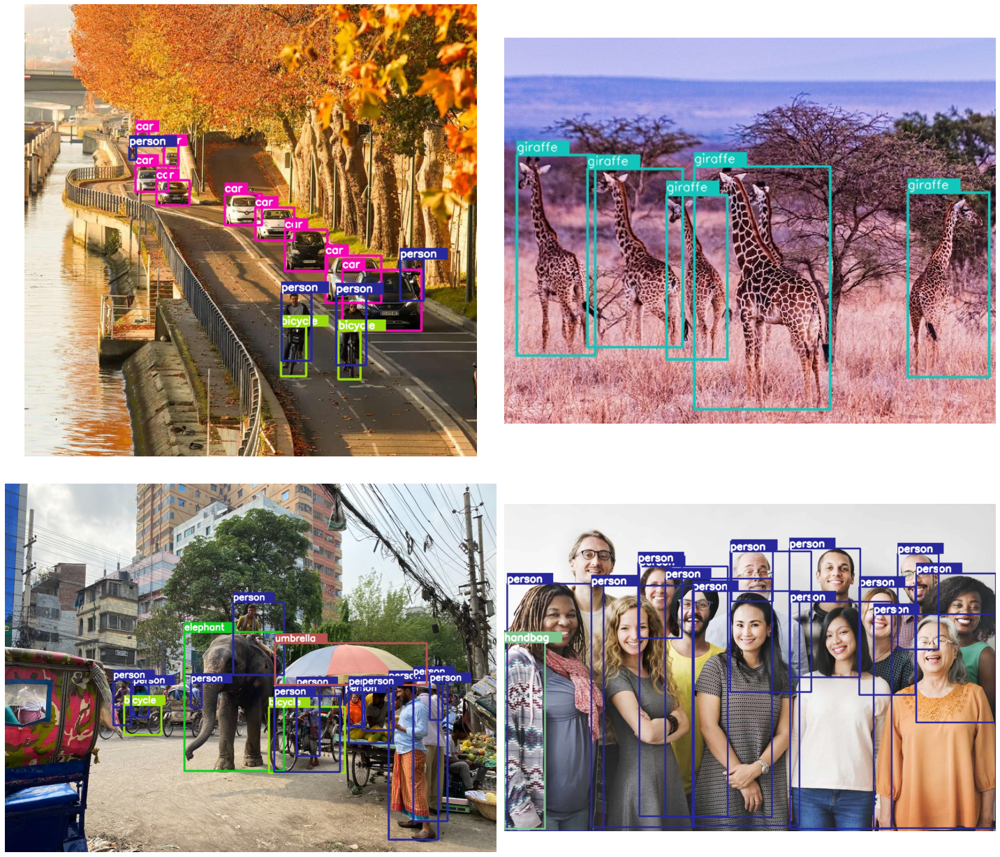

In [ ]:
# Visualize
visualize(result_dir)

## References

- [FCOS TorchVision](https://pytorch.org/vision/main/models/fcos.html)